Example API Usage: Characterizing a Single Compound
===

Author: Nathan A. Mahynski

Date: 2024/11/26

Description: Example of how to use FINCHnmr's API to create substances and libraries, then use this to characterize a new sample.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/mahynski/finchnmr/blob/main/docs/jupyter/example_api.ipynb)

1. Install [FINCHnmr](https://github.com/mahynski/finchnmr) using pip.

In [1]:
# pip install finchnmr

In [2]:
import finchnmr
from finchnmr import analysis, library, model, substance

import numpy as np
import matplotlib.pyplot as plt

2. Load an HSQC NMR (1H-13C) dataset to use as a background library.  Here we will use a dataset from [HuggingFace](https://huggingface.co/datasets/mahynski/bmrb-hsqc-nmr-1H13C).  If the [datasets](https://pypi.org/project/datasets/) package is not installed, do so now. In this example we will also use [dotenv](https://pypi.org/project/python-dotenv/) to load a token to access this dataset.

In [3]:
# pip install datasets, load_dotenv

In [4]:
import os
from dotenv import load_dotenv
_ = load_dotenv(".env")
HF_TOKEN = os.getenv("HF_TOKEN")

In [5]:
from datasets import load_dataset

nmr_dataset = load_dataset(
  "mahynski/bmrb-hsqc-nmr-1H13C", 
  split="train",
  token=HF_TOKEN,
  trust_remote_code=True, 
)

In [6]:
substances = [
    finchnmr.substance.Substance(
        pathname=d['pathname'], 
        name=d['name'], 
        warning='ignore'
    ) for d in nmr_dataset
]

In [7]:
lib = finchnmr.library.Library(substances)

In [8]:
lib.substance_by_index(79).plot(backend='plotly')

In [9]:
lib.substance_by_name('Apocholic_acid').plot(backend='plotly')

3. Load an "unknown" mixture we would like to identify.

In [10]:
# Load a variety of unknowns
unknown_dataset = load_dataset(
  "mahynski/bmrb-hsqc-nmr-1H13C", 
  split="test",
  token=HF_TOKEN,
  trust_remote_code=True, 
)

# Make a library out of them for simplicity
unknown_lib = finchnmr.library.Library([
    finchnmr.substance.Substance(
        pathname=d['pathname'], 
        name=d['name'], 
        warning='ignore'
    ) for d in unknown_dataset
])

# Select one of them to model
target = unknown_lib.substance_by_name('1904')

# Examine our selection
target.plot(absolute_values=True, backend='plotly', cmap='Reds')

4. Fit a model to the selection.

In [11]:
optimized_models, analyses = finchnmr.model.optimize_models(
    targets=[target],
    nmr_library=lib,
    nmr_model=finchnmr.model.LASSO, # Use a Lasso model to obtain a sparse solution
    param_grid={'alpha': np.logspace(-16, 0, 10)}, # Select a range of alpha values to examine sparsity
    model_kw={'max_iter':1000, 'selection':'cyclic', 'random_state':42, 'tol':0.0001} # These are default, but you can adjust
)

Iterating through targets: 0it [00:00, ?it/s]
Iterating through parameter sets: 100%|█████████████████████████████████████████████████| 10/10 [00:11<00:00,  1.20s/it]
Iterating through targets: 1it [00:13, 13.39s/it]


In [12]:
optimized_models[0]

LASSO(alpha=1e-16, max_iter=1000, random_state=42)

5. Examine the best result.

In [13]:
# Let's see how well the model reconstructs the original
recon = optimized_models[0].reconstruct()
recon.plot(cmap='Reds', backend='plotly')

In [14]:
# The score is the coefficient of determination from the model
optimized_models[0].score()

0.33568468743007407

In [15]:
# Examine the main components
analyses[0].plot_top_importances(k=10, by_name=True, backend='plotly')

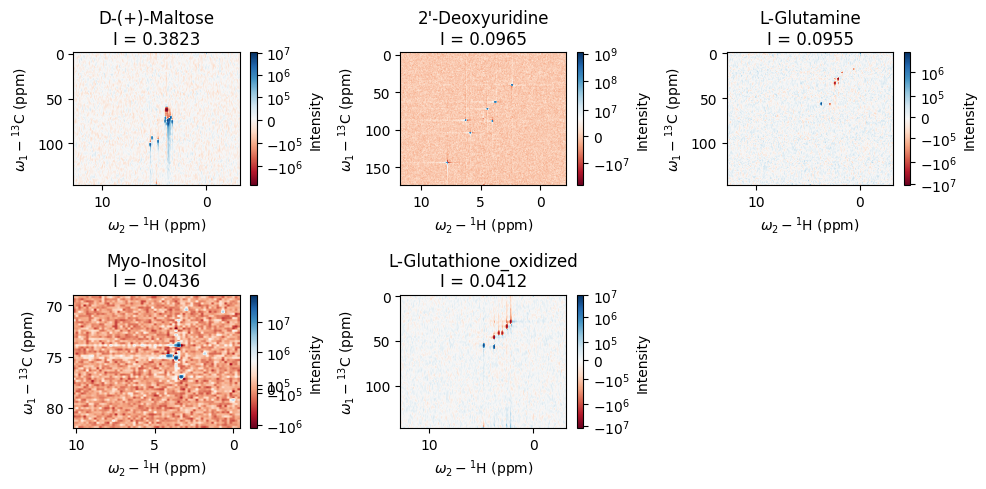

In [16]:
# Examine the main components spectra
_ = analyses[0].plot_top_spectra(k=5)
plt.tight_layout()

In [17]:
# Examine the residual to see what else needs to be explained
residual = analyses[0].build_residual()
residual.plot(absolute_values=True, cmap='Reds', backend='plotly')